 Forecasting - balanced data, feature engineering and feature selection


# Imports

In [33]:
## Import libraries 
## Data manipulation 
import pandas as pd
import numpy as np

pd.set_option('display.max_columns', None)

## plot
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.offline as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import plotly.tools as tls
import plotly.figure_factory as ff
py.init_notebook_mode(connected=True)
import squarify
%matplotlib inline

## Data processing, metrics and modeling
from sklearn.model_selection import GridSearchCV, cross_val_score, train_test_split, GridSearchCV, RandomizedSearchCV
from sklearn.metrics import precision_score, recall_score, confusion_matrix,  roc_curve, precision_recall_curve, accuracy_score, roc_auc_score, f1_score
import lightgbm as lgbm
from sklearn.ensemble import VotingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import roc_curve,auc
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import StratifiedKFold
from yellowbrick.classifier import DiscriminationThreshold


# Stats
import scipy.stats as ss
from scipy import interp
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform

# SMOTH 
from imblearn.pipeline import Pipeline
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

##ignore warning messages 
#import warnings
#warnings.filterwarnings('ignore') 


In [34]:
## Import data
df = pd.read_csv("Data/diab_ckd_data.csv")

# Create target columns

In [35]:
#Target columns (Dependent variables 1,2 and 3)
DV1Filter = (df.TIME_CRF<=2) & (df.EVENT_CRF==1)
DV2Filter = (df.TIME_CRF<=5) & (df.EVENT_CRF==1)
DV3Filter = (df.TIME_CRF<=10) & (df.EVENT_CRF==1)
df["DV1"] = DV1Filter.astype(int)
df["DV2"] = DV2Filter.astype(int)
df["DV3"] = DV3Filter.astype(int)
df.head()

,IDS,TIME_CRF,EVENT_CRF,IS_MALE,AGE_AT_SDATE,AGE_GROUP,SES_GROUP,MIGZAR,IS_HYPERTENSION,SE_HYPERTENSION,IS_ISCHEMIC_MI,SE_ISCHEMIC_MI,IS_CVA_TIA,SE_CVA_TIA,IS_DEMENTIA,SE_DEMENTIA,IS_ART_SCLE_GEN,SE_ART_SCLE_GEN,IS_TROMBOPHILIA,SE_TROMBOPHILIA,IS_IBD,SE_IBD,BMI_AT_BASELINE,SYSTOLA_AT_BASELINE,DIASTOLA_AT_BASELINE,Creatinine_B_AT_BASELINE,Albumin_B_AT_BASELINE,Urea_B_AT_BASELINE,Glucose_B_AT_BASELINE,HbA1C_AT_BASELINE,RBCRed_Blood_Cells_AT_BASELINE,Hemoglobin_AT_BASELINE,Ferritin_AT_BASELINE,AST_GOT_AT_BASELINE,ALT_GPT_AT_BASELINE,Bilirubin_Total_AT_BASELINE,Na_Sodium_B_AT_BASELINE,K_Potassium_B_AT_BASELINE,CaCalcium_B_AT_BASELINE,HDLCholesterol_AT_BASELINE,LDLCholesterol_AT_BASELINE,Triglycerides_AT_BASELINE,PTH_AT_BASELINE,DV1,DV2,DV3
0,122931,0.05,1,0,72.97,"[60, 75)",HI,GENERAL,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,19.89,122.0,65.5,1.30,3.9,71.0,NaN,9.55,3.87,11.70,NaN,34.0,22.2,NaN,138.5,4.60,9.25,31.80,69.0,271.0,NaN,1,1,1
1,98909,14.15,0,0,70.30,"[60, 75)",MID,GENERAL,1,6.85,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,41.23,150.0,85.0,0.90,NaN,33.5,162.5,7.20,4.96,12.70,NaN,22.5,24.5,NaN,136.5,4.45,NaN,62.60,116.7,114.5,NaN,0,0,0
2,65611,19.21,0,0,53.46,"[45, 60)",MID,HAREDI,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,137.0,7.85,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.00,136.8,81.0,NaN,0,0,0
3,95847,15.82,0,0,81.75,"[75, 120)",MID,GENERAL,1,5.18,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,NaN,130.0,80.0,0.85,NaN,35.0,153.0,7.20,5.07,14.50,NaN,106.0,132.0,NaN,140.0,4.70,NaN,41.15,139.2,233.5,NaN,0,0,0
4,91914,7.20,0,1,85.35,"[75, 120)",HI,GENERAL,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,0,NaN,24.45,122.5,73.0,0.74,4.5,50.5,117.5,6.70,4.74,14.65,184.5,21.0,18.0,1.1,137.0,4.25,8.90,64.00,148.8,81.0,26.0,0,0,0


# Spliting data (train and test)

In [36]:
## Split data
from sklearn.model_selection import train_test_split
df, df_test = train_test_split(df,test_size=0.20,random_state=0,
                                                    stratify=df["DV1"])

# Preprocessing data

In [37]:
## Create copy of data frames
X = df.copy()
X_test = df_test.copy()

### Encoding of categorical data

In [38]:
## Encoding categorical data ("SES_GROUP" and "MIGZAR")
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
labelEncoder = LabelEncoder()

## AGE_GROUP
# labelEncoder.fit(df["AGE_GROUP"])
# X["AGE_GROUP"] = labelEncoder.transform(df["AGE_GROUP"])
# X_test["AGE_GROUP"] = labelEncoder.transform(df_test["AGE_GROUP"])

# ## change to one hot encoding
# labelEncoder.fit(df["SES_GROUP"])
# X["SES_GROUP"] = labelEncoder.transform(df["SES_GROUP"])
# X_test["SES_GROUP"] = labelEncoder.transform(df_test["SES_GROUP"])


OH_encoder = OneHotEncoder(handle_unknown="ignore", sparse=False)
SES_col = list(df["SES_GROUP"].unique())
OH_X = OH_encoder.fit_transform(df["SES_GROUP"].values.reshape(-1,1)) 
OH_X = pd.DataFrame(OH_X, columns=SES_col)
OH_X_test = OH_encoder.transform(X_test["SES_GROUP"].values.reshape(-1,1)) 
OH_X_test = pd.DataFrame(OH_X_test, columns=SES_col)
#Drop SES column and add OH SES columns to X
X.drop(["SES_GROUP"], axis=1, inplace=True)
X_test.drop(["SES_GROUP"], axis=1, inplace=True)
X.index= OH_X.index
X_test.index= OH_X_test.index
X = pd.concat([X, OH_X], axis=1)
X_test = pd.concat([X_test, OH_X_test], axis=1)
X.drop(["OTHER"], axis=1, inplace=True)
X_test.drop(["OTHER"], axis=1, inplace=True)


OH_encoder = OneHotEncoder(handle_unknown="ignore", sparse=False)
MIGZAR_col = list(df["MIGZAR"].unique())
OH_X = OH_encoder.fit_transform(df["MIGZAR"].values.reshape(-1,1)) 
OH_X = pd.DataFrame(OH_X, columns=MIGZAR_col)
OH_X_test = OH_encoder.transform(X_test["MIGZAR"].values.reshape(-1,1)) 
OH_X_test = pd.DataFrame(OH_X_test, columns=MIGZAR_col)
#Drop Migzar column and add OH Migzar columns to X
X.drop(["MIGZAR"], axis=1, inplace=True)
X_test.drop(["MIGZAR"], axis=1, inplace=True)
X.index= OH_X.index
X_test.index= OH_X_test.index
X = pd.concat([X, OH_X], axis=1)
X_test = pd.concat([X_test, OH_X_test], axis=1)

### Split data frame to Features (X) and Target (y)- dropping unrelavent columns


In [39]:
## Split to Features and target columns
## Drop unrelevent columns
y = X["DV1"]
X.drop(["IDS", "TIME_CRF", "EVENT_CRF","DV1", "DV2","DV3", "AGE_GROUP", "GENERAL"],
       axis=1, inplace=True)
y_test = X_test["DV1"]
X_test.drop(["IDS", "TIME_CRF", "EVENT_CRF","DV1", "DV2","DV3", "AGE_GROUP", "GENERAL"],
            axis=1, inplace=True)

## Missing values


Number of columns with missing data: 28


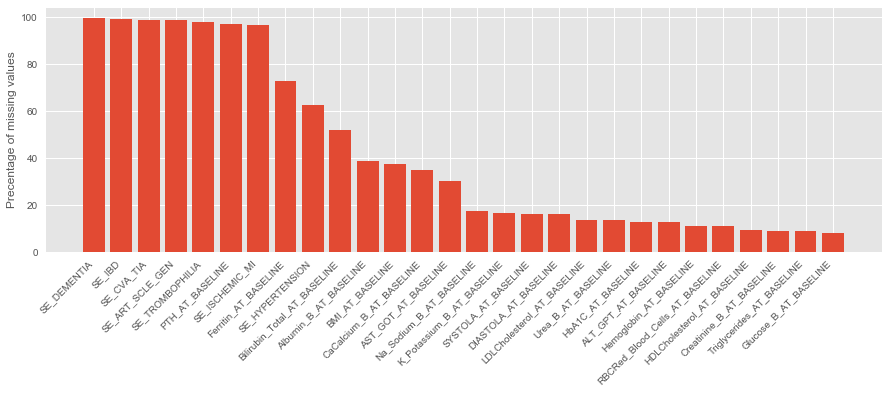

In [45]:
## Missing values
null_df = X.isnull().sum() * 100 / len(df)
null_df.sort_values(ascending=False, inplace=True)
null_df = null_df[null_df.values!=0] # Removing columns without missing values
fig, ax = plt.subplots(figsize= (15,5))
plt.style.use("seaborn")
ax.bar(null_df.index, null_df.values)
fig.autofmt_xdate(rotation=45)
ax.set_ylabel("Precentage of missing values")
print("Number of columns with missing data: {}".format(null_df.size))
plt.show()

### SE and IS columns
Turn SE column to categorical column  
Delete IS columns

In [40]:
## Function- convert SE columns to categorical data
def convertSEs2categories(value):
  if(np.isnan(value)): 
    return 4
  if(value <= SE_25Quant):
    return 1
  elif(value <= SE_75Quant):
    return 2
  else:
    return 3

for element in df.columns: 
  if ((element[0:3] == 'SE_')or(element == 'PTH_AT_BASELINE') or 
      (element == 'Ferritin_AT_BASELINE') or 
      (element == 'Bilirubin_Total_AT_BASELINE') or 
      (element == 'Albumin_B_AT_BASELINE') or 
      (element == 'CaCalcium_B_AT_BASELINE') ):
    # SE_columns.append(element)
    SE_25Quant = df.loc[df["DV1"]==0,element].quantile(q = 0.25)
    SE_75Quant = df.loc[df["DV1"]==0,element].quantile(q = 0.75)
    X[element] = X[element].apply(lambda x: convertSEs2categories(x))
    X_test[element] = X_test[element].apply(lambda x: convertSEs2categories(x))
    #print(X[element].value_counts())

  else:
    pass


In [41]:
## Deleting IS columns
for element in df.columns: 
  if (element[0:3] == 'IS_'):
    if(element=='IS_MALE'):
        pass
    else:
        X.drop([element], axis=1, inplace=True)
        X_test.drop([element], axis=1, inplace=True)
    

Number of columns with missing data: 16


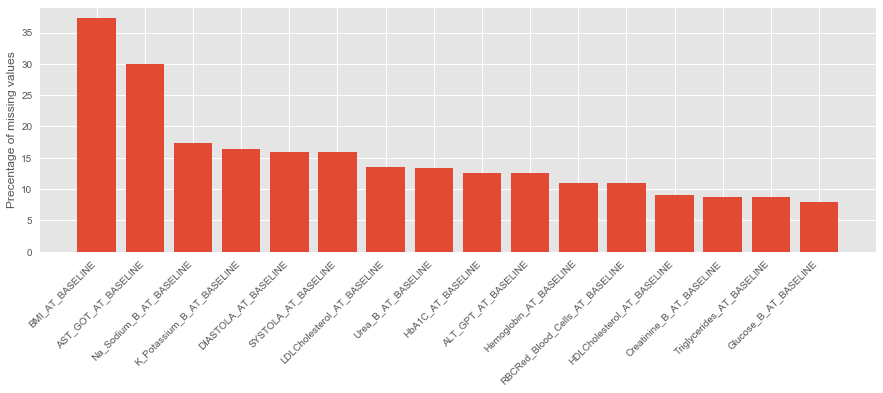

In [71]:
## Missing values
null_df = X.isnull().sum() * 100 / len(df)
null_df.sort_values(ascending=False, inplace=True)
null_df = null_df[null_df.values!=0] # Removing columns without missing values
fig, ax = plt.subplots(figsize= (15,5))
plt.style.use("seaborn")
ax.bar(null_df.index, null_df.values)
fig.autofmt_xdate(rotation=45)
ax.set_ylabel("Precentage of missing values")
print("Number of columns with missing data: {}".format(null_df.size))
plt.show()

### Imputing of data

In [42]:
## Save column names to fit after imputing
X_columns = X.columns
X_test_columns = X_test.columns

In [43]:
## Impute data (using median)
from sklearn.impute import SimpleImputer
imp = SimpleImputer(missing_values=np.nan, strategy='median')
X = imp.fit_transform(X)
X_test = imp.transform(X_test)
X = pd.DataFrame(X, columns=X_columns)
X_test = pd.DataFrame(X_test, columns=X_test_columns)

In [15]:
X.head()

,IS_MALE,AGE_AT_SDATE,SE_HYPERTENSION,SE_ISCHEMIC_MI,SE_CVA_TIA,SE_DEMENTIA,SE_ART_SCLE_GEN,SE_TROMBOPHILIA,SE_IBD,BMI_AT_BASELINE,SYSTOLA_AT_BASELINE,DIASTOLA_AT_BASELINE,Creatinine_B_AT_BASELINE,Albumin_B_AT_BASELINE,Urea_B_AT_BASELINE,Glucose_B_AT_BASELINE,HbA1C_AT_BASELINE,RBCRed_Blood_Cells_AT_BASELINE,Hemoglobin_AT_BASELINE,Ferritin_AT_BASELINE,AST_GOT_AT_BASELINE,ALT_GPT_AT_BASELINE,Bilirubin_Total_AT_BASELINE,Na_Sodium_B_AT_BASELINE,K_Potassium_B_AT_BASELINE,CaCalcium_B_AT_BASELINE,HDLCholesterol_AT_BASELINE,LDLCholesterol_AT_BASELINE,Triglycerides_AT_BASELINE,PTH_AT_BASELINE,LOW,HI,MID,HAREDI,ARAB
0,0.0,57.11,3.0,4.0,4.0,4.0,4.0,4.0,4.0,30.850,175.0,80.0,0.70,2.0,37.0,130.0,6.1,4.480,12.60,2.0,71.0,49.0,4.0,141.0,4.4,1.0,54.9,140.10,139.0,4.0,0.0,1.0,0.0,0.0,1.0
1,0.0,50.91,4.0,4.0,4.0,4.0,4.0,4.0,4.0,34.465,116.0,74.0,0.64,1.0,32.0,82.0,6.5,4.705,14.50,2.0,22.0,15.0,1.0,140.0,4.2,2.0,52.0,115.75,376.0,4.0,1.0,0.0,0.0,0.0,0.0
2,1.0,51.00,1.0,1.0,2.0,4.0,4.0,4.0,4.0,33.410,134.0,80.0,1.15,2.0,25.9,135.0,6.4,5.160,16.10,4.0,41.0,54.0,2.0,140.0,4.7,4.0,43.2,115.75,160.0,4.0,0.0,1.0,0.0,0.0,0.0
3,1.0,41.53,2.0,4.0,4.0,4.0,4.0,4.0,4.0,30.850,115.0,80.0,1.00,3.0,32.0,110.0,6.7,5.020,14.60,4.0,19.5,22.0,2.0,141.0,4.8,1.0,41.8,112.40,134.0,4.0,0.0,0.0,1.0,0.0,0.0
4,1.0,45.42,4.0,4.0,4.0,4.0,4.0,4.0,4.0,27.880,140.0,80.0,0.80,1.0,36.5,287.5,11.1,5.440,15.95,2.0,33.5,39.0,1.0,138.0,4.3,2.0,41.3,103.90,220.0,4.0,0.0,0.0,1.0,0.0,0.0


Number of columns with missing data: 0


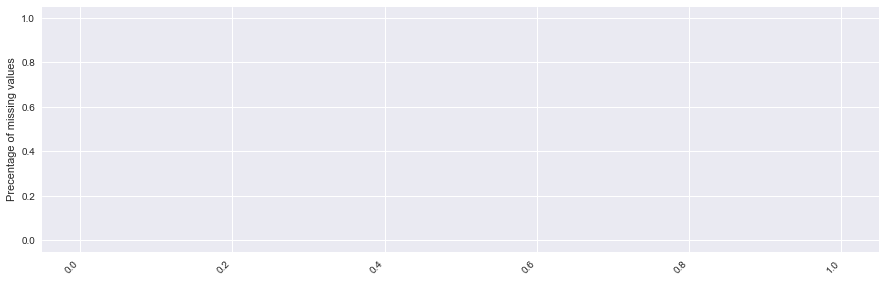

In [16]:
## Missing values
null_df = X.isnull().sum() * 100 / len(df)
null_df.sort_values(ascending=False, inplace=True)
null_df = null_df[null_df.values!=0] # Removing columns without missing values
fig, ax = plt.subplots(figsize= (15,5))
plt.style.use("seaborn")
ax.bar(null_df.index, null_df.values)
fig.autofmt_xdate(rotation=45)
ax.set_ylabel("Precentage of missing values")
print("Number of columns with missing data: {}".format(null_df.size))
plt.show()

### Feature engineering

Glucose   
In patients with both T1D and T2D, high HbA1c levels are associated with an increased risk for developing nephropathy.
Albumin_B_AT_BASELINE vs HbA1C_AT_BASELINE
Indeed, in the Diabetes Control and Complications Trial/Epidemiologs (DCCT/EDIC) study, patients with moderate albuminuria, but lower HbA1c levels, had a 
lower risk for progressing to severe albuminuria or ESRD.  

Blood pressure  
Key insights:
Statistically significant effect of systolic and diastolic on DV1. 
  
Feature enginnering:  
systolic: less than 120 mm Hg  
        diastolic: less than 80 mm Hg  

BMI
"Obesity is also associated with increased risk of diabetic nephropathy. In DCCT, abdominal obesity, evaluated by waist circumference,was associated with a higher incidence of albuminuria, but did not predict a decline in GFR. On the other hand, weight loss reduces urinary albumin excretion and prevents the decline in GFR ." 
Dosent seem like there is a clear correlation.

Dyslipidemia
lowering LDL-C levels is associated with delayed progression of the disease

creatinine  
"In most patients, the first sign of diabetic 
nephropathy is moderately increased urinary alumin excretion, i.e. 30-300 mg/g creatinine in a spot urine sample (also termed microalbuminuria). Patients who develop severely increased albuminuria, i.e. >300 mg albumin/g creatinine in a spot urine sample (also called macroalbuminuria or clinical albuminuria), are at particularly high 
risk for developing a decline in renal function"  

Albumin_B_AT_BASELINE
"urinary albumin excretion (UAE) is not a necessary prerequisite for the development of diabetic nephropathy"


In [44]:
## Feature engineering
## Glucose: Albumin_B_AT_BASELINE vs HbA1C_AT_BASELINE relationship
X["ALbumin_HBA1c"] = (X["Albumin_B_AT_BASELINE"] < 3.7) & (X["HbA1C_AT_BASELINE"] < 7.5)
X["RBCRed_HBA1c"] = (X["RBCRed_Blood_Cells_AT_BASELINE"] > 5.2) & (X["HbA1C_AT_BASELINE"] > 7.5)
X_test["ALbumin_HBA1c"] = (X_test["Albumin_B_AT_BASELINE"] < 3.7) & (X_test["HbA1C_AT_BASELINE"] < 7.5)
X_test["RBCRed_HBA1c"] = (X_test["RBCRed_Blood_Cells_AT_BASELINE"] > 5.2) & (X_test["HbA1C_AT_BASELINE"] > 7.5)

## High blood pressure
X["bp_normal"] = (X["SYSTOLA_AT_BASELINE"] < 120) & (X["DIASTOLA_AT_BASELINE"] < 80)
X_test["bp_normal"] = (X_test["SYSTOLA_AT_BASELINE"] < 120) & (X_test["DIASTOLA_AT_BASELINE"] < 80)

##OTHER
## Triglycerides_AT_BASELINE Glucose_B_AT_BASELINE
X["new_1"] = (X["Triglycerides_AT_BASELINE"] > 400) & (X["Glucose_B_AT_BASELINE"] > 175)
X_test["new_1"] = (X_test["Triglycerides_AT_BASELINE"] < 400) & (X_test["Glucose_B_AT_BASELINE"] > 175)

## AGE
X["new_2"] = (X["AGE_AT_SDATE"] <40)
X_test["new_2"] = (X_test["AGE_AT_SDATE"] < 40)

##ALT_GPT_AT_BASELINE
X["new_3"] = (X["ALT_GPT_AT_BASELINE"] > 50)
X_test["new_3"] = (X_test["ALT_GPT_AT_BASELINE"] > 50)

## Creatinine_B_AT_BASELINE Ferritin_AT_BASELINE Bilirubin_Total_AT_BASELINE
X["new_4"] = (X["Creatinine_B_AT_BASELINE"] < 1.5) & (X["Ferritin_AT_BASELINE"] > 400)
X_test["new_4"] = (X_test["Creatinine_B_AT_BASELINE"] < 1.5) & (X_test["Ferritin_AT_BASELINE"] > 400)

X["new_5"] = (X["Creatinine_B_AT_BASELINE"] < 1.5) & (X["Bilirubin_Total_AT_BASELINE"] > 1)
X_test["new_5"] = (X_test["Creatinine_B_AT_BASELINE"] < 1.5) & (X_test["Bilirubin_Total_AT_BASELINE"] > 1)


In [18]:
X.head()

,IS_MALE,AGE_AT_SDATE,SE_HYPERTENSION,SE_ISCHEMIC_MI,SE_CVA_TIA,SE_DEMENTIA,SE_ART_SCLE_GEN,SE_TROMBOPHILIA,SE_IBD,BMI_AT_BASELINE,SYSTOLA_AT_BASELINE,DIASTOLA_AT_BASELINE,Creatinine_B_AT_BASELINE,Albumin_B_AT_BASELINE,Urea_B_AT_BASELINE,Glucose_B_AT_BASELINE,HbA1C_AT_BASELINE,RBCRed_Blood_Cells_AT_BASELINE,Hemoglobin_AT_BASELINE,Ferritin_AT_BASELINE,AST_GOT_AT_BASELINE,ALT_GPT_AT_BASELINE,Bilirubin_Total_AT_BASELINE,Na_Sodium_B_AT_BASELINE,K_Potassium_B_AT_BASELINE,CaCalcium_B_AT_BASELINE,HDLCholesterol_AT_BASELINE,LDLCholesterol_AT_BASELINE,Triglycerides_AT_BASELINE,PTH_AT_BASELINE,LOW,HI,MID,HAREDI,ARAB,ALbumin_HBA1c,RBCRed_HBA1c,bp_normal,new_1,new_2,new_3,new_4
0,0.0,57.11,3.0,4.0,4.0,4.0,4.0,4.0,4.0,30.850,175.0,80.0,0.70,2.0,37.0,130.0,6.1,4.480,12.60,2.0,71.0,49.0,4.0,141.0,4.4,1.0,54.9,140.10,139.0,4.0,0.0,1.0,0.0,0.0,1.0,True,False,False,False,False,False,True
1,0.0,50.91,4.0,4.0,4.0,4.0,4.0,4.0,4.0,34.465,116.0,74.0,0.64,1.0,32.0,82.0,6.5,4.705,14.50,2.0,22.0,15.0,1.0,140.0,4.2,2.0,52.0,115.75,376.0,4.0,1.0,0.0,0.0,0.0,0.0,True,False,True,False,False,False,False
2,1.0,51.00,1.0,1.0,2.0,4.0,4.0,4.0,4.0,33.410,134.0,80.0,1.15,2.0,25.9,135.0,6.4,5.160,16.10,4.0,41.0,54.0,2.0,140.0,4.7,4.0,43.2,115.75,160.0,4.0,0.0,1.0,0.0,0.0,0.0,True,False,False,False,False,True,True
3,1.0,41.53,2.0,4.0,4.0,4.0,4.0,4.0,4.0,30.850,115.0,80.0,1.00,3.0,32.0,110.0,6.7,5.020,14.60,4.0,19.5,22.0,2.0,141.0,4.8,1.0,41.8,112.40,134.0,4.0,0.0,0.0,1.0,0.0,0.0,True,False,False,False,False,False,True
4,1.0,45.42,4.0,4.0,4.0,4.0,4.0,4.0,4.0,27.880,140.0,80.0,0.80,1.0,36.5,287.5,11.1,5.440,15.95,2.0,33.5,39.0,1.0,138.0,4.3,2.0,41.3,103.90,220.0,4.0,0.0,0.0,1.0,0.0,0.0,False,True,False,False,False,False,False


### Balancing data

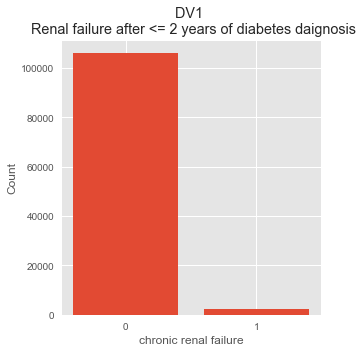

In [45]:
## Target column
a1 = y.value_counts()

fig, (ax1) = plt.subplots(figsize = (5,5))
ax1.bar(a1.index, a1.values)
ax1.set_xticks([0,1])
ax1.set_xlabel("chronic renal failure")
ax1.set_ylabel("Count")
ax1.set_title("DV1 \n Renal failure after <= 2 years of diabetes daignosis")
plt.tight_layout()
plt.show()

In [46]:
over = SMOTE(sampling_strategy=0.1, k_neighbors=5)
under = RandomUnderSampler(sampling_strategy=0.5)
X,y = over.fit_resample(X,y)
X,y = under.fit_resample(X,y)

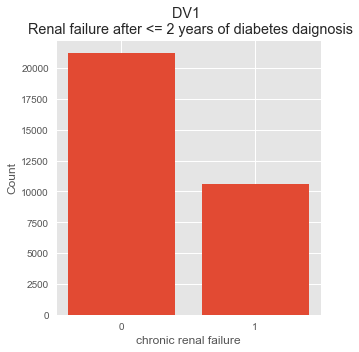

In [47]:
## Target column

a1 = y.value_counts()
fig, (ax1) = plt.subplots(figsize = (5,5))
ax1.bar(a1.index, a1.values)
ax1.set_xticks([0,1])
ax1.set_xlabel("chronic renal failure")
ax1.set_ylabel("Count")
ax1.set_title("DV1 \n Renal failure after <= 2 years of diabetes daignosis")
plt.tight_layout()
plt.show()

### Feature engineering

In [48]:
## Correlation matrix
Numerical = ['BMI_AT_BASELINE', 'SYSTOLA_AT_BASELINE', 'DIASTOLA_AT_BASELINE',
       'Creatinine_B_AT_BASELINE', 'Albumin_B_AT_BASELINE',
       'Urea_B_AT_BASELINE', 'Glucose_B_AT_BASELINE', 'HbA1C_AT_BASELINE',
       'RBCRed_Blood_Cells_AT_BASELINE', 'Hemoglobin_AT_BASELINE',
       'Ferritin_AT_BASELINE', 'AST_GOT_AT_BASELINE', 'ALT_GPT_AT_BASELINE',
       'Bilirubin_Total_AT_BASELINE', 'Na_Sodium_B_AT_BASELINE',
       'K_Potassium_B_AT_BASELINE', 'CaCalcium_B_AT_BASELINE',
       'HDLCholesterol_AT_BASELINE', 'LDLCholesterol_AT_BASELINE',
       'Triglycerides_AT_BASELINE', 'PTH_AT_BASELINE', 'SE_HYPERTENSION',
             'SE_ISCHEMIC_MI', 'SE_CVA_TIA','SE_DEMENTIA','SE_ART_SCLE_GEN',
             'SE_TROMBOPHILIA','SE_IBD', 'AGE_AT_SDATE']
corrMatrix = pd.concat([X[Numerical],y], axis=1).corr()

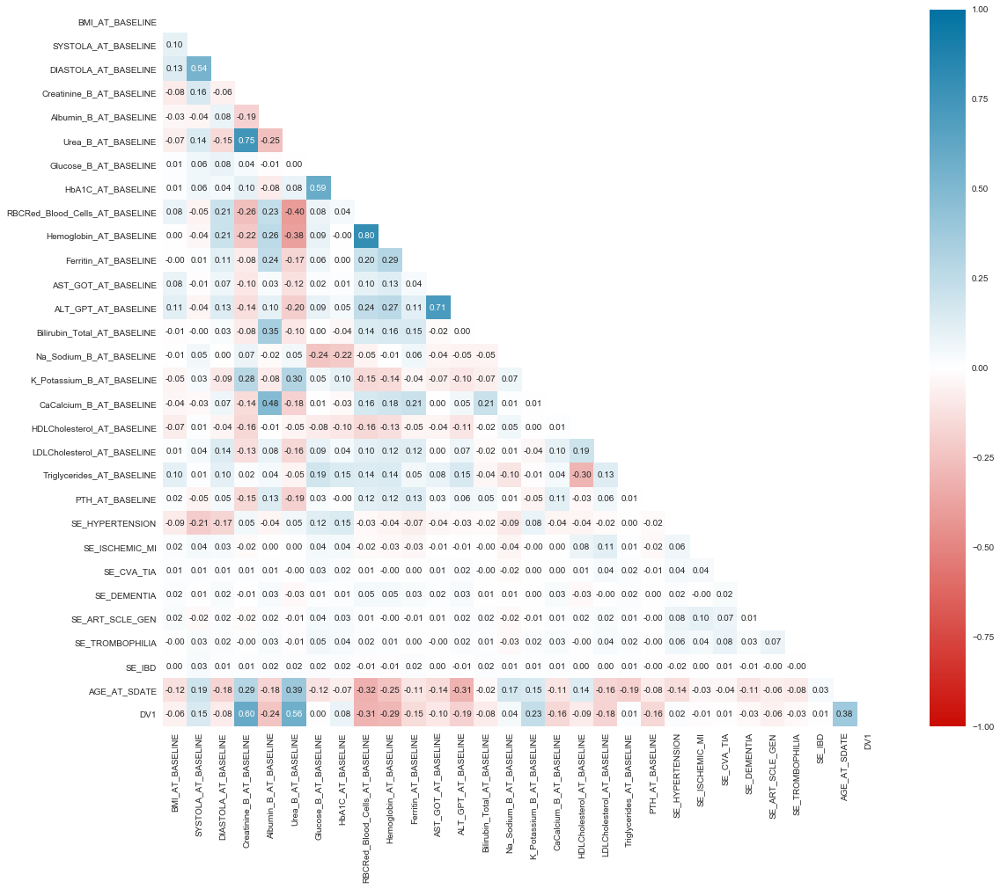

In [23]:
## heatmap
from matplotlib.colors import LinearSegmentedColormap
mask = np.zeros_like(corrMatrix)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(20, 15))
    ax = sns.heatmap(corrMatrix, mask=mask, square=True,
                     cmap=LinearSegmentedColormap.from_list('rb',["r", "w", "b"],N=256),
                    annot=True, vmin=-1, vmax=1, fmt='.2f')
    # plt.savefig("corr_matrix.png")
plt.show()

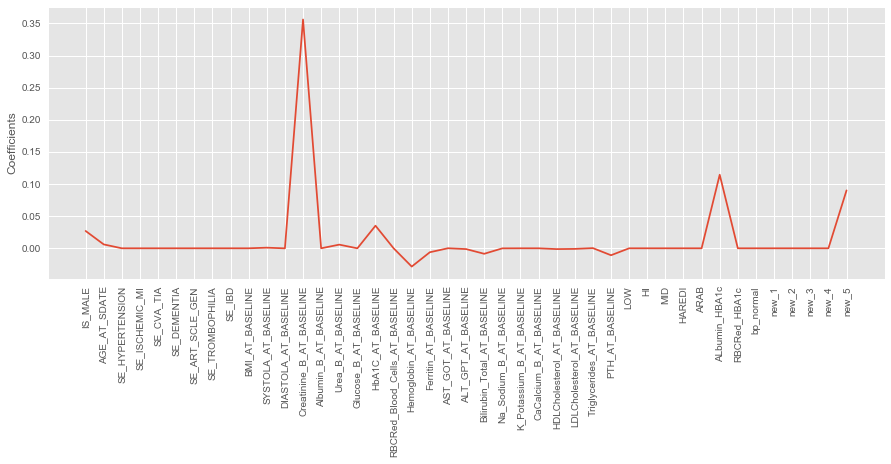

In [49]:
## Lasso regression
from sklearn.linear_model import Lasso
names = X.columns
lasso = Lasso(alpha=0.007)
lasso_coef_1 = lasso.fit(X, y).coef_
fig, ax1 = plt.subplots(figsize = (15, 5))
plt.style.use('ggplot')

ax1.plot(range(len(names)), lasso_coef_1)
ax1.set_xticks(range(len(names)))
ax1.set_xticklabels(names, rotation=90)
ax1.set_ylabel('Coefficients')
plt.show()

In [61]:
temp = X

In [18]:
X.columns

Index(['IS_MALE', 'AGE_AT_SDATE', 'SE_HYPERTENSION', 'SE_ISCHEMIC_MI',
       'SE_CVA_TIA', 'SE_DEMENTIA', 'SE_ART_SCLE_GEN', 'SE_TROMBOPHILIA',
       'SE_IBD', 'BMI_AT_BASELINE', 'SYSTOLA_AT_BASELINE',
       'DIASTOLA_AT_BASELINE', 'Creatinine_B_AT_BASELINE',
       'Albumin_B_AT_BASELINE', 'Urea_B_AT_BASELINE', 'Glucose_B_AT_BASELINE',
       'HbA1C_AT_BASELINE', 'RBCRed_Blood_Cells_AT_BASELINE',
       'Hemoglobin_AT_BASELINE', 'Ferritin_AT_BASELINE', 'AST_GOT_AT_BASELINE',
       'ALT_GPT_AT_BASELINE', 'Bilirubin_Total_AT_BASELINE',
       'Na_Sodium_B_AT_BASELINE', 'K_Potassium_B_AT_BASELINE',
       'CaCalcium_B_AT_BASELINE', 'HDLCholesterol_AT_BASELINE',
       'LDLCholesterol_AT_BASELINE', 'Triglycerides_AT_BASELINE',
       'PTH_AT_BASELINE', 'LOW', 'HI', 'MID', 'HAREDI', 'ARAB',
       'ALbumin_HBA1c', 'RBCRed_HBA1c', 'bp_normal', 'new_1', 'new_2', 'new_3',
       'new_4'],
      dtype='object')

In [50]:
## 0.007
X = X[["IS_MALE", "AGE_AT_SDATE", "Creatinine_B_AT_BASELINE", "Urea_B_AT_BASELINE", "HbA1C_AT_BASELINE",
      "Hemoglobin_AT_BASELINE",'Ferritin_AT_BASELINE','Bilirubin_Total_AT_BASELINE', 'LOW','HI', "ALbumin_HBA1c", "new_5"]]
X_test = X_test[["IS_MALE", "AGE_AT_SDATE", "Creatinine_B_AT_BASELINE", "Urea_B_AT_BASELINE", "HbA1C_AT_BASELINE",
      "Hemoglobin_AT_BASELINE",'Ferritin_AT_BASELINE','Bilirubin_Total_AT_BASELINE', 'LOW','HI', "ALbumin_HBA1c", "new_5"]]

In [55]:
# ## 0.1
# X = X[["AGE_AT_SDATE", "SYSTOLA_AT_BASELINE", "Urea_B_AT_BASELINE", "ALT_GPT_AT_BASELINE",
#        'HDLCholesterol_AT_BASELINE', 'Triglycerides_AT_BASELINE']]
# X_test = X_test[["AGE_AT_SDATE", "SYSTOLA_AT_BASELINE", "Urea_B_AT_BASELINE", "ALT_GPT_AT_BASELINE",
#        'HDLCholesterol_AT_BASELINE', 'Triglycerides_AT_BASELINE']]

In [31]:
# ## 0.01
# X = X[["IS_MALE", "AGE_AT_SDATE", "Creatinine_B_AT_BASELINE", "Urea_B_AT_BASELINE", "HbA1C_AT_BASELINE",
#       "Hemoglobin_AT_BASELINE", "ALbumin_HBA1c", "new_4"]]
# X_test = X_test[["IS_MALE", "AGE_AT_SDATE", "Creatinine_B_AT_BASELINE", "Urea_B_AT_BASELINE", "HbA1C_AT_BASELINE",
#       "Hemoglobin_AT_BASELINE", "ALbumin_HBA1c", "new_4"]]

In [93]:
# X = X[["SE_HYPERTENSION", "Creatinine_B_AT_BASELINE", "Urea_B_AT_BASELINE", "HbA1C_AT_BASELINE",
#       "Hemoglobin_AT_BASELINE", "Na_Sodium_B_AT_BASELINE", "CaCalcium_B_AT_BASELINE",
#       "PTH_AT_BASELINE"]]
# X_test = X_test[["SE_HYPERTENSION", "Creatinine_B_AT_BASELINE", "Urea_B_AT_BASELINE", "HbA1C_AT_BASELINE",
#       "Hemoglobin_AT_BASELINE", "Na_Sodium_B_AT_BASELINE", "CaCalcium_B_AT_BASELINE",
#       "PTH_AT_BASELINE"]]

# Forecasting using LightGBM

In [51]:
#ignore warning messages 
import warnings
warnings.filterwarnings('ignore') 

## Paramater setting (RandomSearchCV) * deactivated

In [203]:
## Gridsearch setting lgbm
random_state=42

fit_params = {"early_stopping_rounds" : 100, 
             "eval_metric" : 'auc', 
             "eval_set" : [(X,y)],
             'eval_names': ['valid'],
             'verbose': 0,
             'categorical_feature': 'auto'}

param_test = {'learning_rate' : [0.01, 0.02, 0.03, 0.04, 0.05, 0.08, 0.1, 0.2, 0.3, 0.4],
              'n_estimators' : [100, 200, 300, 400, 500, 600, 800, 1000, 1500, 2000],
              'num_leaves': sp_randint(6, 50), 
              'min_child_samples': sp_randint(100, 500), 
              'min_child_weight': [1e-5, 1e-3, 1e-2, 1e-1, 1, 1e1, 1e2, 1e3, 1e4],
              'subsample': sp_uniform(loc=0.2, scale=0.8), 
              'max_depth': [-1, 1, 2, 3, 4, 5, 6, 7],
              'colsample_bytree': sp_uniform(loc=0.4, scale=0.6),
              'reg_alpha': [0, 1e-1, 1, 2, 5, 7, 10, 50, 100],
              'reg_lambda': [0, 1e-1, 1, 5, 10, 20, 50, 100]}

#number of combinations
n_iter = 300

#intialize lgbm and lunch the search
lgbm_clf = lgbm.LGBMClassifier(random_state=random_state, silent=True, metric='None', n_jobs=4)
grid_search = RandomizedSearchCV(
    estimator=lgbm_clf, param_distributions=param_test, 
    n_iter=n_iter,
    scoring='accuracy',
    cv=5,
    refit=True,
    random_state=random_state,
    verbose=True)

grid_search.fit(X, y, **fit_params)
opt_parameters =  grid_search.best_params_
lgbm_clf = lgbm.LGBMClassifier(**opt_parameters)

Fitting 5 folds for each of 300 candidates, totalling 1500 fits


## Paramater setting (manual)

In [204]:
opt_parameters

{'colsample_bytree': 0.5351996786275169,
 'learning_rate': 0.08,
 'max_depth': 6,
 'min_child_samples': 211,
 'min_child_weight': 0.1,
 'n_estimators': 1000,
 'num_leaves': 14,
 'reg_alpha': 10,
 'reg_lambda': 1,
 'subsample': 0.6196091116562037}

In [21]:
## manual lgbm setting
opt_parameters_manual = {'learning_rate' : 0.08,
              'n_estimators' : 1000,
              'num_leaves': 14, 
              'min_child_samples': 211, 
              'min_child_weight': 0.1,
              'subsample': 0.6196091116562037, 
              'max_depth': 6,
              'colsample_bytree': 0.5351996786275169,
              'reg_alpha': 10,
              'reg_lambda': 1}
lgbm_clf_man = lgbm.LGBMClassifier(**opt_parameters_manual)

In [22]:
## Function- model performance
def model_performance(model, subtitle) :   
    #Kfold
    cv = StratifiedKFold(n_splits=5, shuffle=False)
    y_real = []
    y_proba = []
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0,1,100)
    i = 1
    
    for train,val in cv.split(X,y):
        model.fit(X.iloc[train], y.iloc[train])
        pred_proba = model.predict_proba(X.iloc[val])
        precision, recall, _ = precision_recall_curve(y.iloc[val], pred_proba[:,1])
        y_real.append(y.iloc[val])
        y_proba.append(pred_proba[:,1])
        fpr, tpr, t = roc_curve(y[val], pred_proba[:, 1])
        tprs.append(interp(mean_fpr, fpr, tpr))
        roc_auc = auc(fpr, tpr)
        aucs.append(roc_auc) 
    
    # Confusion matrix
    y_pred = cross_val_predict(model, X, y, cv=5)
    conf_matrix = confusion_matrix(y, y_pred)
    trace1 = go.Heatmap(z = conf_matrix  ,x = ["0 (pred)","1 (pred)"],
                        y = ["0 (true)","1 (true)"],xgap = 2, ygap = 2, 
                        colorscale = 'Viridis', showscale  = False)
    
    #Show metrics
    tp = conf_matrix[1,1]
    fn = conf_matrix[1,0]
    fp = conf_matrix[0,1]
    tn = conf_matrix[0,0]
    Accuracy  =  ((tp+tn)/(tp+tn+fp+fn))
    Precision =  (tp/(tp+fp))
    Recall    =  (tp/(tp+fn))
    F1_score  =  (2*(((tp/(tp+fp))*(tp/(tp+fn)))/((tp/(tp+fp))+(tp/(tp+fn)))))

    show_metrics = pd.DataFrame(data=[[Accuracy , Precision, Recall, F1_score]])
    show_metrics = show_metrics.T

    colors = ['gold', 'lightgreen', 'lightcoral', 'lightskyblue']
    trace2 = go.Bar(x = (show_metrics[0].values), 
                    y = ['Accuracy', 'Precision', 'Recall', 'F1_score'], text = np.round_(show_metrics[0].values,4),
                    textposition = 'auto', textfont=dict(color='black'),
                    orientation = 'h', opacity = 1, marker=dict(
            color=colors,
            line=dict(color='#000000',width=1.5)))

    #Roc curve
    mean_tpr = np.mean(tprs, axis=0)
    mean_auc = auc(mean_fpr, mean_tpr)

    trace3 = go.Scatter(x=mean_fpr, y=mean_tpr,
                        name = "Roc : " ,
                        line = dict(color = ('rgb(22, 96, 167)'),width = 2), fill='tozeroy')
    trace4 = go.Scatter(x = [0,1],y = [0,1],
                        line = dict(color = ('black'),width = 1.5,
                        dash = 'dot'))
    
    #Precision - recall curve
    y_real = y
    y_proba = np.concatenate(y_proba)
    precision, recall, _ = precision_recall_curve(y_real, y_proba)

    trace5 = go.Scatter(x = recall, y = precision,
                        name = "Precision" + str(precision),
                        line = dict(color = ('lightcoral'),width = 2), fill='tozeroy')
    
    mean_auc=round(mean_auc,3)
    #Subplots
    fig = tls.make_subplots(rows=2, cols=2, print_grid=False,
                          specs=[[{}, {}], 
                                 [{}, {}]],
                          subplot_titles=('Confusion Matrix',
                                          'Metrics',
                                          'ROC curve'+" "+ '('+ str(mean_auc)+')',
                                          'Precision - Recall curve',
                                          ))
    #Trace and layout
    fig.append_trace(trace1,1,1)
    fig.append_trace(trace2,1,2)
    fig.append_trace(trace3,2,1)
    fig.append_trace(trace4,2,1)
    fig.append_trace(trace5,2,2)
    
    fig['layout'].update(showlegend = False, title = '<b>Model performance report (5 folds)</b><br>'+subtitle,
                        autosize = False, height = 830, width = 830,
                        plot_bgcolor = 'black',
                        paper_bgcolor = 'black',
                        margin = dict(b = 195), font=dict(color='white'))
    fig["layout"]["xaxis1"].update(color = 'white')
    fig["layout"]["yaxis1"].update(color = 'white')
    fig["layout"]["xaxis2"].update((dict(range=[0, 1], color = 'white')))
    fig["layout"]["yaxis2"].update(color = 'white')
    fig["layout"]["xaxis3"].update(dict(title = "false positive rate"), color = 'white')
    fig["layout"]["yaxis3"].update(dict(title = "true positive rate"),color = 'white')
    fig["layout"]["xaxis4"].update(dict(title = "recall"), range = [0,1.05],color = 'white')
    fig["layout"]["yaxis4"].update(dict(title = "precision"), range = [0,1.05],color = 'white')
    for i in fig['layout']['annotations']:
        i['font'] = titlefont=dict(color='white', size = 14)
    py.iplot(fig)

In [23]:
## Function - Scores table
def scores_table(model, subtitle):
    scores = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
    res = []
    for sc in scores:
        scores = cross_val_score(model, X, y, cv = 5, scoring = sc)
        res.append(scores)
    df = pd.DataFrame(res).T
    df.loc['mean'] = df.mean()
    df.loc['std'] = df.std()
    df= df.rename(columns={0: 'accuracy', 1:'precision', 2:'recall',3:'f1',4:'roc_auc'})

    trace = go.Table(
        header=dict(values=['<b>Fold', '<b>Accuracy', '<b>Precision', '<b>Recall', '<b>F1 score', '<b>Roc auc'],
                    line = dict(color='#7D7F80'),
                    fill = dict(color='#a1c3d1'),
                    align = ['center'],
                    font = dict(size = 15)),
        cells=dict(values=[('1','2','3','4','5','mean', 'std'),
                           np.round(df['accuracy'],3),
                           np.round(df['precision'],3),
                           np.round(df['recall'],3),
                           np.round(df['f1'],3),
                           np.round(df['roc_auc'],3)],
                   line = dict(color='#7D7F80'),
                   fill = dict(color='#EDFAFF'),
                   align = ['center'], font = dict(size = 15)))

    layout = dict(width=800, height=400, title = '<b>Cross Validation - 5 folds</b><br>'+subtitle, font = dict(size = 15))
    fig = dict(data=[trace], layout=layout)

    py.iplot(fig, filename = 'styled_table')

### Model performance on training data with cross validation

In [32]:
model_performance(lgbm_clf_man, 'LightGBM- Over_Under_feature engineering and selection')

In [33]:
scores_table(lgbm_clf_man, 'LightGBM- Over_Under_feature engineering and selection')

### Model performance on test data

In [24]:
## Function- model performance test data
def model_performance_testData(model, subtitle) :   
    y_real = []
    y_proba = []
    tprs = []
    aucs = []
    mean_fpr = np.linspace(0,1,100)
    i = 1
    
    model.fit(X, y)
    pred_proba = model.predict_proba(X_test)
    precision, recall, _ = precision_recall_curve(y_test, pred_proba[:,1])
    y_real.append(y_test)
    y_proba.append(pred_proba)
    fpr, tpr, t = roc_curve(y_test, pred_proba[:,1])
    tprs.append(interp(mean_fpr, fpr, tpr))
    roc_auc = auc(fpr, tpr)
    aucs.append(roc_auc) 
    
    # Confusion matrix
    # y_pred = cross_val_predict(model, X, y, cv=5)
    y_pred = model.predict(X_test)
    conf_matrix = confusion_matrix(y_test, y_pred)
    trace1 = go.Heatmap(z = conf_matrix  ,x = ["0 (pred)","1 (pred)"],
                        y = ["0 (true)","1 (true)"],xgap = 2, ygap = 2, 
                        colorscale = 'Viridis', showscale  = False)
    
    #Show metrics
    tp = conf_matrix[1,1]
    fn = conf_matrix[1,0]
    fp = conf_matrix[0,1]
    tn = conf_matrix[0,0]
    Accuracy  =  ((tp+tn)/(tp+tn+fp+fn))
    Precision =  (tp/(tp+fp))
    Recall    =  (tp/(tp+fn))
    F1_score  =  (2*(((tp/(tp+fp))*(tp/(tp+fn)))/((tp/(tp+fp))+(tp/(tp+fn)))))

    show_metrics = pd.DataFrame(data=[[Accuracy , Precision, Recall, F1_score]])
    show_metrics = show_metrics.T

    colors = ['gold', 'lightgreen', 'lightcoral', 'lightskyblue']
    trace2 = go.Bar(x = (show_metrics[0].values), 
                    y = ['Accuracy', 'Precision', 'Recall', 'F1_score'], text = np.round_(show_metrics[0].values,4),
                    textposition = 'auto', textfont=dict(color='black'),
                    orientation = 'h', opacity = 1, marker=dict(
            color=colors,
            line=dict(color='#000000',width=1.5)))

    #Roc curve
    mean_tpr = np.mean(tprs, axis=0)
    mean_auc = auc(mean_fpr, mean_tpr)

    trace3 = go.Scatter(x=mean_fpr, y=mean_tpr,
                        name = "Roc : " ,
                        line = dict(color = ('rgb(22, 96, 167)'),width = 2), fill='tozeroy')
    trace4 = go.Scatter(x = [0,1],y = [0,1],
                        line = dict(color = ('black'),width = 1.5,
                        dash = 'dot'))
    
    #Precision - recall curve
    y_real = y_test
    y_proba = np.concatenate(y_proba)
    precision, recall, _ = precision_recall_curve(y_real, y_proba[:,1])

    trace5 = go.Scatter(x = recall, y = precision,
                        name = "Precision" + str(precision),
                        line = dict(color = ('lightcoral'),width = 2), fill='tozeroy')
    
    mean_auc=round(mean_auc,3)
    #Subplots
    fig = tls.make_subplots(rows=2, cols=2, print_grid=False,
                          specs=[[{}, {}], 
                                 [{}, {}]],
                          subplot_titles=('Confusion Matrix',
                                          'Metrics',
                                          'ROC curve'+" "+ '('+ str(mean_auc)+')',
                                          'Precision - Recall curve',
                                          ))
    #Trace and layout
    fig.append_trace(trace1,1,1)
    fig.append_trace(trace2,1,2)
    fig.append_trace(trace3,2,1)
    fig.append_trace(trace4,2,1)
    fig.append_trace(trace5,2,2)
    
    fig['layout'].update(showlegend = False, title = '<b>Model performance report- (test data)</b><br>'+subtitle,
                        autosize = False, height = 830, width = 830,
                        plot_bgcolor = 'black',
                        paper_bgcolor = 'black',
                        margin = dict(b = 195), font=dict(color='white'))
    fig["layout"]["xaxis1"].update(color = 'white')
    fig["layout"]["yaxis1"].update(color = 'white')
    fig["layout"]["xaxis2"].update((dict(range=[0, 1], color = 'white')))
    fig["layout"]["yaxis2"].update(color = 'white')
    fig["layout"]["xaxis3"].update(dict(title = "false positive rate"), color = 'white')
    fig["layout"]["yaxis3"].update(dict(title = "true positive rate"),color = 'white')
    fig["layout"]["xaxis4"].update(dict(title = "recall"), range = [0,1.05],color = 'white')
    fig["layout"]["yaxis4"].update(dict(title = "precision"), range = [0,1.05],color = 'white')
    for i in fig['layout']['annotations']:
        i['font'] = titlefont=dict(color='white', size = 14)
    py.iplot(fig)
    plt.show()

In [25]:
model_performance_testData(lgbm_clf_man, 'LightGBM- Over_Under_feature engineering and selection')
## Should add color legend for confusion matrix on presentation

In [27]:
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier

In [28]:
model_2 = LogisticRegression()
model_3 = XGBClassifier()
model_4 = DecisionTreeClassifier()
model_5 = KNeighborsClassifier()
model_6 = RandomForestClassifier()
#model_7 = SVC(class_weight='balanced', probability=True)

In [52]:
model_performance_testData(model_2, 'LogisticRegression- Over_Under_feature engineering and selection')

In [30]:
model_performance_testData(model_3, 'Model_3- Over_Under_feature engineering and selection')

[12:54:32] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [53]:
model_performance_testData(model_4, 'DecisionTreeClassifier- Over_Under_feature engineering and selection')

In [32]:
model_performance_testData(model_5, 'Model_5- Over_Under_feature engineering and selection')

In [42]:
model_performance_testData(model_6, 'Model_6- Over_Under_feature engineering and selection')

In [ ]:
#model_performance_testData(model_7, 'Model_7- Over_Under_feature engineering and selection')

In [43]:
model_performance(model_3, 'model_3- Over_Under_feature engineering and selection')

[08:08:23] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[08:08:24] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[08:08:25] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[08:08:26] WARNING: ..\src\learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old be